# Trabajo práctico 3

Visión por computadora - CEIA - FIUBA

Integrantes: 
- Barquinero, Mauro
- Campos, Mariano
- Perez, Jose 
- Ojeda, Juan

### Consigna: Encontrar el logotipo de la gaseosa dentro de las imágenes provistas en Material_TPs/TP3/images a partir del template Material_TPs/TP3/template
 1. (4 puntos) Obtener una detección del logo en cada imagen sin falsos positivos
 2.  (4 puntos) Plantear y validar un algoritmo para múltiples detecciones en la imagen coca_multi.png con el mismo témplate del ítem 1
 3. (2 puntos) Generalizar el algoritmo del item 2 para todas las imágenes.

### 1. Obtener una detección del logo en cada imagen sin falsos positivos

### Evaluación de métodos de coincidencia con `matchTemplate`

Se desarrolló un algoritmo que permite evaluar el desempeño de los distintos métodos de *template matching* disponibles en OpenCV (`cv.matchTemplate`). A continuación, se detallan los pasos implementados:

1. **Preprocesamiento de imágenes**:  
   - Se convierte la imagen original a escala de grises.
   - Se aplica detección de bordes utilizando el operador de Canny tanto a la imagen de entrada como a la plantilla.

2. **Escalado de la plantilla**:  
   - Se genera una grilla de escalas (entre un valor máximo y mínimo configurable).
   - Para cada escala, se redimensiona la plantilla y se descarta si excede el tamaño de la imagen a analizar.

3. **Evaluación multialgoritmo**:  
   - Se itera sobre los seis métodos clásicos de OpenCV:  
     `TM_CCOEFF`, `TM_CCOEFF_NORMED`, `TM_CCORR`, `TM_CCORR_NORMED`, `TM_SQDIFF`, `TM_SQDIFF_NORMED`.
   - Para cada combinación de método y escala, se calcula la puntuación de coincidencia.
   - Se guarda la mejor coincidencia obtenida (mayor score para la mayoría de los métodos, menor para los de tipo `SQDIFF`).

4. **Visualización de resultados**:  
   - Se dibuja un recuadro sobre la mejor coincidencia encontrada para cada método.
   - Se muestra el resultado con la puntuación y escala correspondientes.



In [9]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def evaluate_matching_algorithms(image_path, template_path, 
                                 canny_threshold1=100, canny_threshold2=200, 
                                 max_scale=3.0, min_scale=0.3, num_scales=100):
    """
    Recorre múltiples métodos de comparación de plantillas OpenCV,
    evaluando el rendimiento a través de diferentes escalas.
    Muestra la mejor coincidencia de cada método con puntuación y escala.
    """
    match_methods = {
        'TM_CCOEFF': cv.TM_CCOEFF,
        'TM_CCOEFF_NORMED': cv.TM_CCOEFF_NORMED,
        'TM_CCORR': cv.TM_CCORR,
        'TM_CCORR_NORMED': cv.TM_CCORR_NORMED,
        'TM_SQDIFF': cv.TM_SQDIFF,
        'TM_SQDIFF_NORMED': cv.TM_SQDIFF_NORMED
    }

    source_img = cv.imread(image_path)
    tmpl_img = cv.imread(template_path, cv.IMREAD_GRAYSCALE)

    if source_img is None or tmpl_img is None:
        raise ValueError(f"Error al cargar imagen o plantilla:\n{image_path} | {template_path}")

    gray_img = cv.cvtColor(source_img, cv.COLOR_BGR2GRAY)
    edge_img = cv.Canny(gray_img, canny_threshold1, canny_threshold2)
    edge_template = cv.Canny(tmpl_img, canny_threshold1, canny_threshold2)

    scale_range = np.linspace(max_scale, min_scale, num_scales)

    for method_key, method_val in match_methods.items():
        highest_score = -np.inf
        top_bbox = None
        optimal_scale = None

        for scale in scale_range:
            resized_template = cv.resize(edge_template, None, fx=scale, fy=scale)
            th, tw = resized_template.shape

            if th > edge_img.shape[0] or tw > edge_img.shape[1]:
                continue

            result = cv.matchTemplate(edge_img, resized_template, method_val)
            min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

            if method_val in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
                match_score = -min_val
                match_loc = min_loc
            else:
                match_score = max_val
                match_loc = max_loc

            if match_score > highest_score:
                highest_score = match_score
                top_bbox = (match_loc[0], match_loc[1], match_loc[0] + tw, match_loc[1] + th)
                optimal_scale = scale

        # Visualize result
        output_img = cv.cvtColor(source_img.copy(), cv.COLOR_BGR2RGB)
        if top_bbox:
            cv.rectangle(output_img, 
                         (top_bbox[0], top_bbox[1]), 
                         (top_bbox[2], top_bbox[3]), 
                         (0, 255, 0), thickness=int(max(source_img.shape) / 180))

        plt.figure(figsize=(10, 4))
        plt.imshow(output_img)
        plt.title(f"{method_key} | Score: {highest_score:.2f} | Scale: {optimal_scale:.2f}")
        plt.axis('off')
        plt.show()


=== PROCESAMIENTO DE IMÁGENES ===
Procesamiento: ./images\COCA-COLA-LOGO.jpg


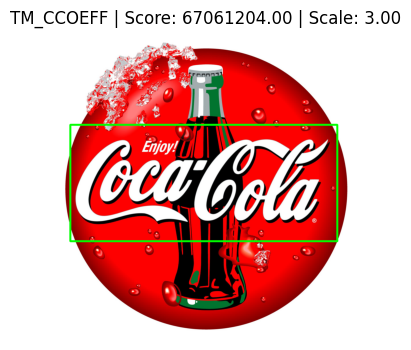

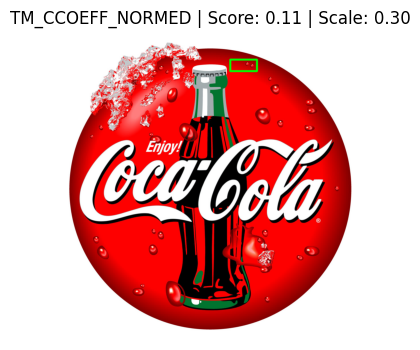

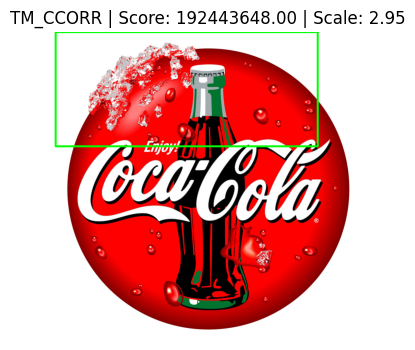

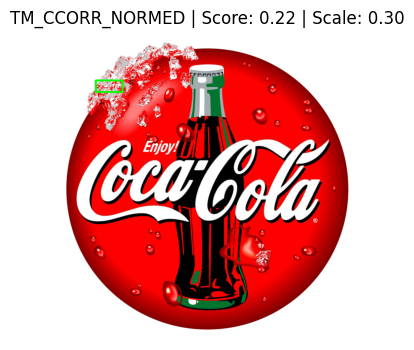

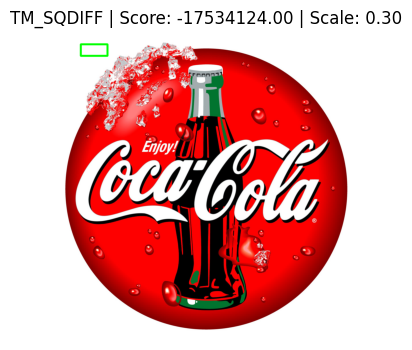

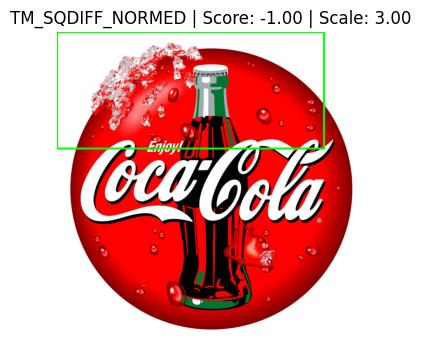

Procesamiento: ./images\coca_logo_1.png


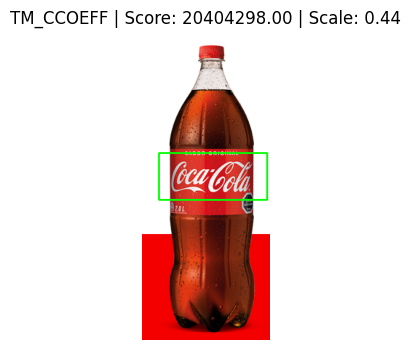

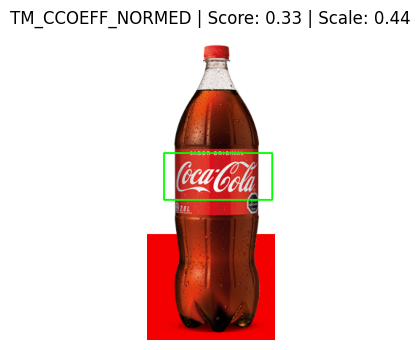

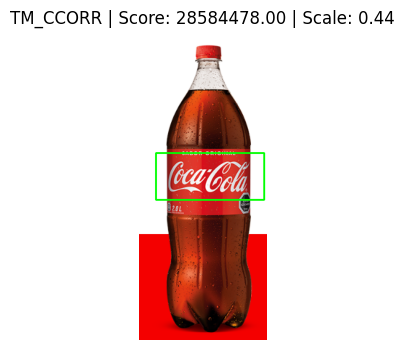

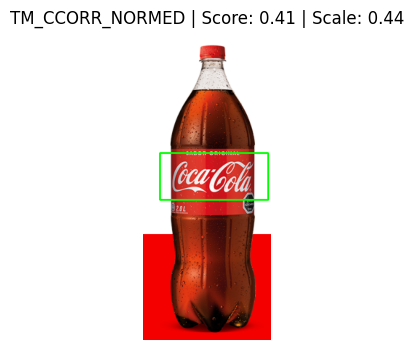

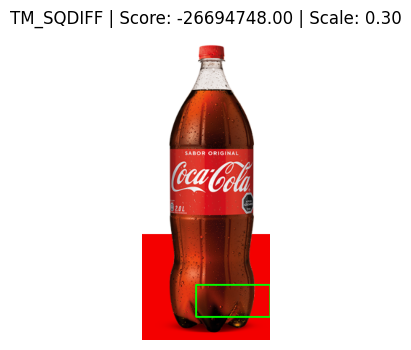

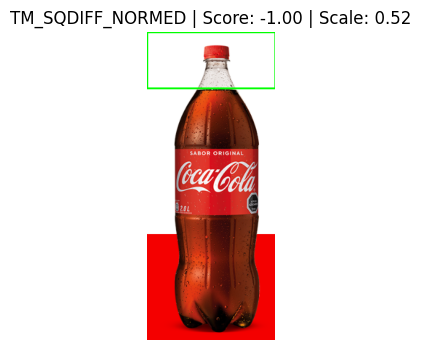

Procesamiento: ./images\coca_logo_2.png


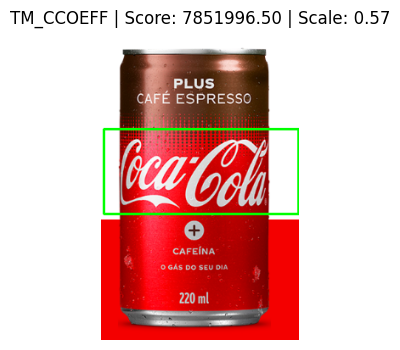

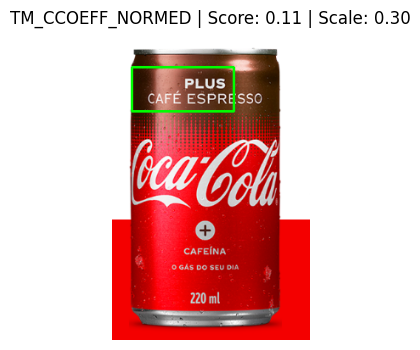

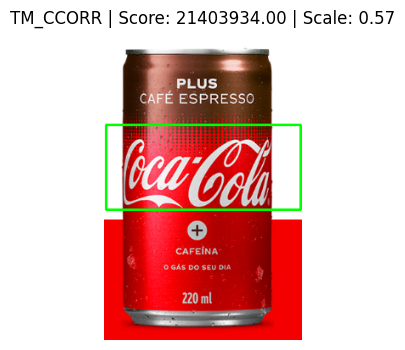

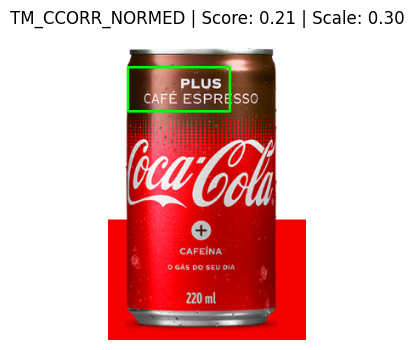

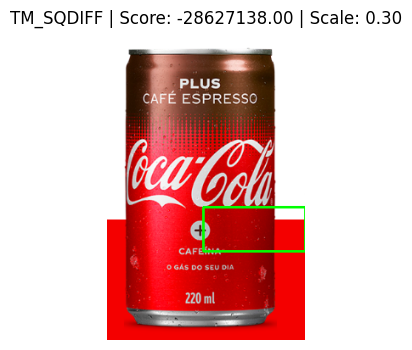

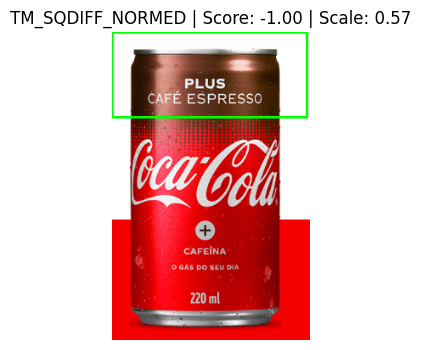

Procesamiento: ./images\coca_multi.png


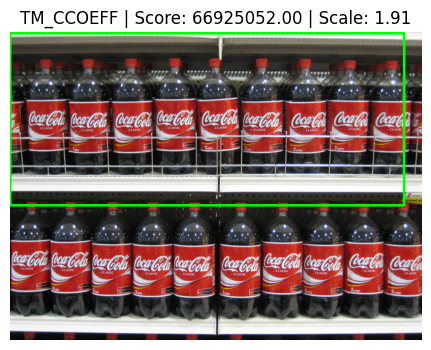

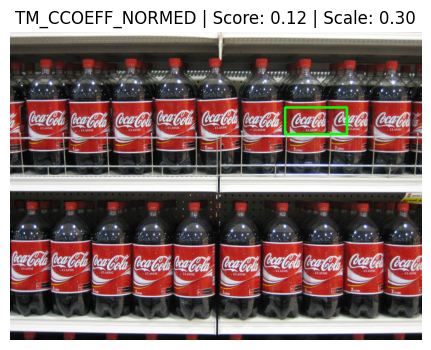

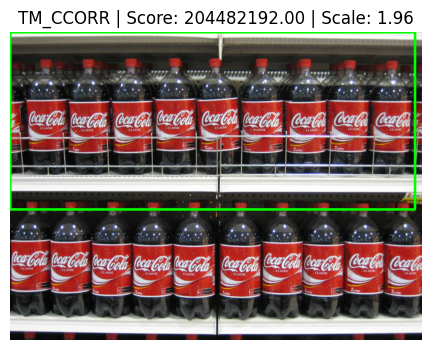

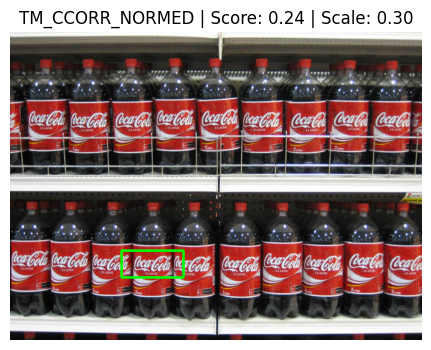

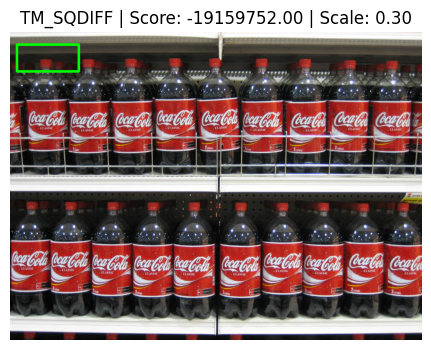

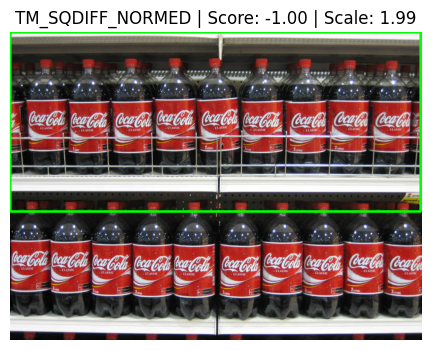

Procesamiento: ./images\coca_retro_1.png


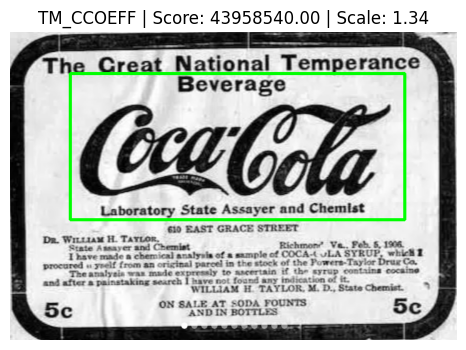

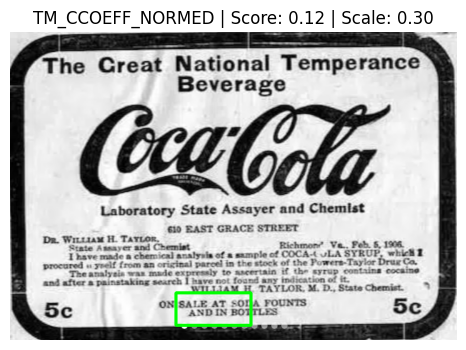

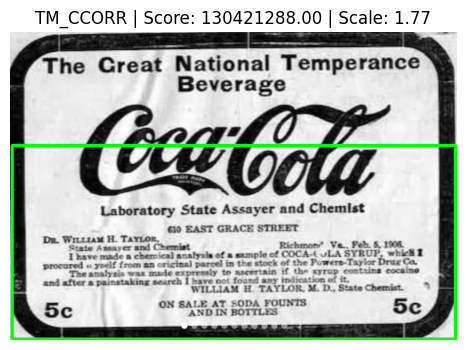

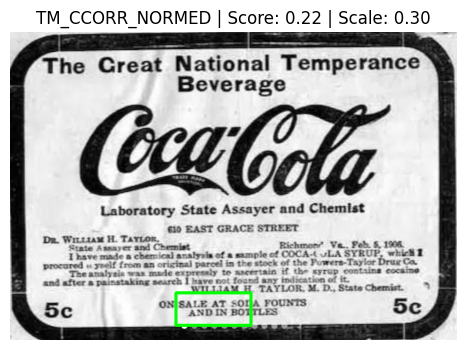

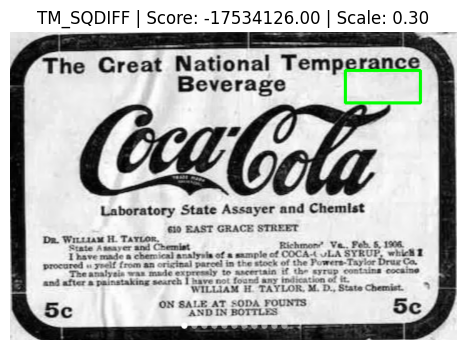

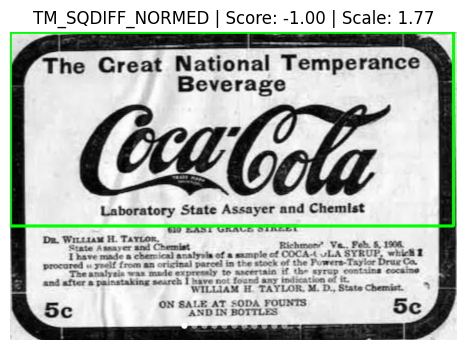

Procesamiento: ./images\coca_retro_2.png


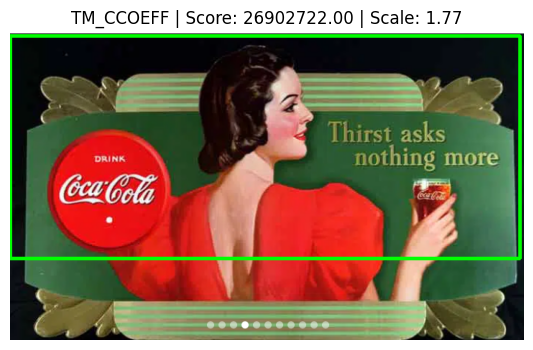

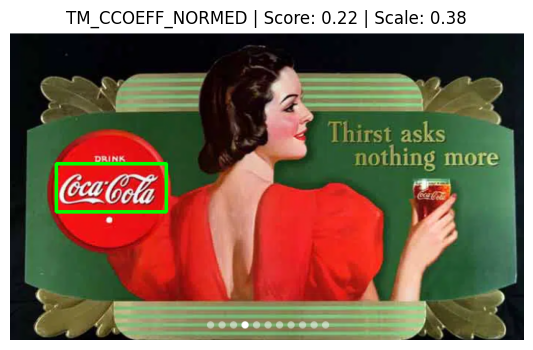

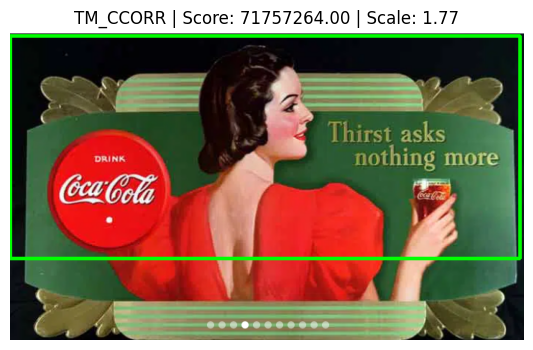

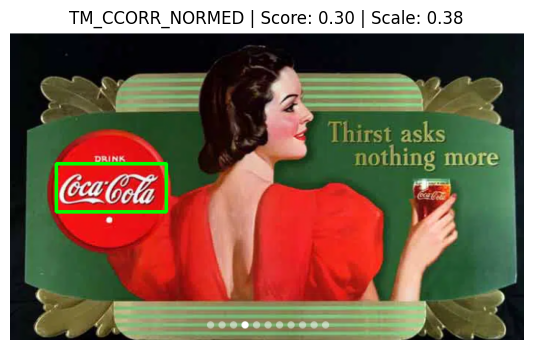

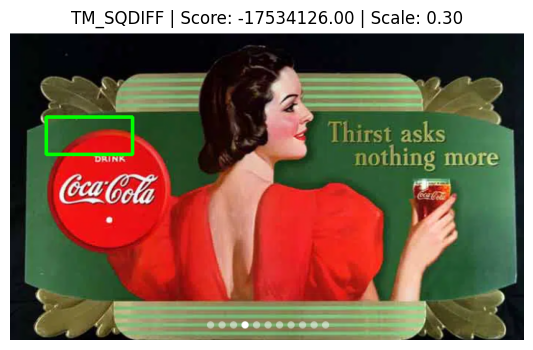

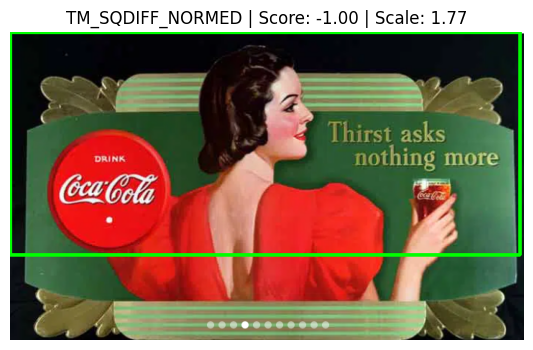

Procesamiento: ./images\logo_1.png


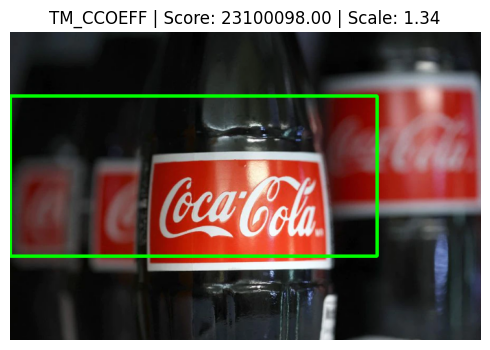

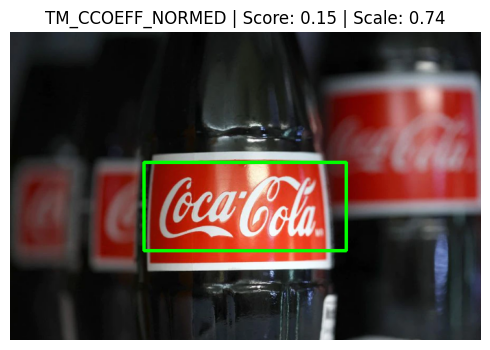

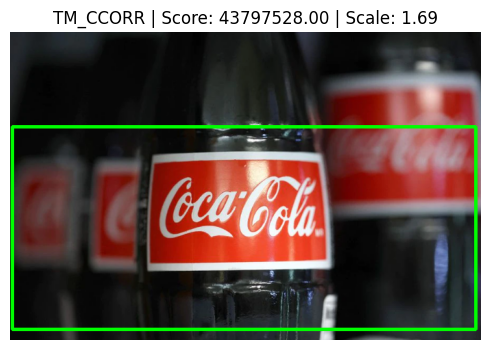

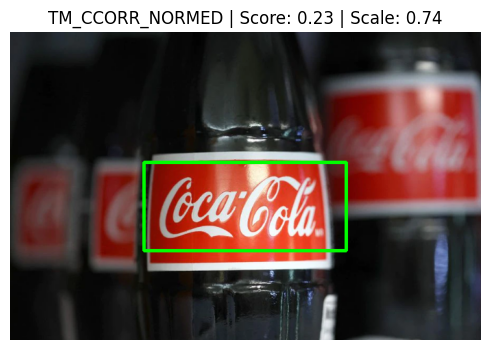

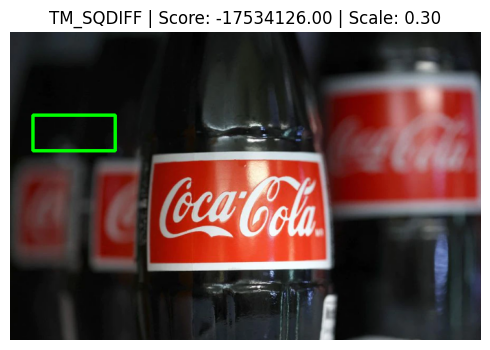

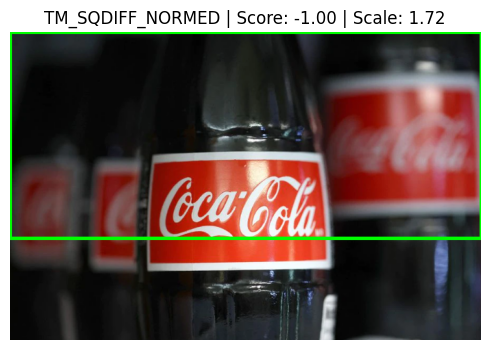

In [ ]:
import os

# Define paths
image_directory = 'vision_computadora_I/Material_TPs/TP3/images'
template_file = 'vision_computadora_I/Material_TPs/TP3/template/pattern.png'

# Supported file formats
supported_extensions = ['.png', '.jpg']

# Collect image files from the directory
image_list = [
    fname for fname in os.listdir(image_directory)
    if os.path.splitext(fname)[1].lower() in supported_extensions
]

print("=== PROCESAMIENTO DE IMÁGENES ===")
for fname in image_list:
    full_image_path = os.path.join(image_directory, fname)
    print(f"Procesamiento: {full_image_path}")
    evaluate_matching_algorithms(full_image_path, template_file)


In [3]:
def execute_template_search(image_path, template_path, method_name,
                            canny1=100, canny2=200, max_scale=3.0,
                            min_scale=0.3, n_scales=100):
    """
    Realiza la correspondencia de plantillas multiescala en una imagen de entrada utilizando la detección de bordes
    y evalúa la mejor correspondencia basándose en el método especificado.

    Parametros:
    - image_path (str): Ruta de archivo de la imagen de destino..
    - template_path (str): Ruta de archivo de la imagen de plantilla.
    - method_name (str):  Método de concordancia OpenCV.
    """

    method = getattr(cv, method_name)

    image = cv.imread(image_path)
    template = cv.imread(template_path, 0)

    if image is None or template is None:
        raise ValueError(
            "Error al cargar la imagen de entrada o la plantilla.")

    gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    edges_image = cv.Canny(gray_image, canny1, canny2)
    edges_template = cv.Canny(template, canny1, canny2)

    scale_values = np.linspace(max_scale, min_scale, n_scales)

    best_score = -np.inf
    best_box = None
    best_scale = None

    for scale in scale_values:
        resized_template = cv.resize(edges_template, None, fx=scale, fy=scale)
        th, tw = resized_template.shape

        if th > edges_image.shape[0] or tw > edges_image.shape[1]:
            continue

        result = cv.matchTemplate(edges_image, resized_template, method)
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)

        if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
            score = -min_val
            top_left = min_loc
        else:
            score = max_val
            top_left = max_loc

        if score > best_score:
            best_score = score
            best_box = (top_left[0], top_left[1],
                        top_left[0] + tw, top_left[1] + th)
            best_scale = scale

    output_image = cv.cvtColor(image.copy(), cv.COLOR_BGR2RGB)
    if best_box:
        cv.rectangle(output_image, (best_box[0], best_box[1]),
                     (best_box[2], best_box[3]), (0, 255, 0), 2)

    plt.figure(figsize=(10, 4))
    plt.imshow(output_image)
    plt.title(
        f"{method_name} | Score: {best_score:.2f} | Scale: {best_scale:.2f}")
    plt.axis('off')
    plt.show()


### Selección manual para resultados finales

Una vez ejecutado el algoritmo de evaluación, se observaron los resultados obtenidos por cada método en cada imagen. De forma manual, se seleccionaron las combinaciones de método y escala que ofrecieron mejores resultados para cada caso particular.

Posteriormente, se volvió a ejecutar el algoritmo utilizando exclusivamente esas combinaciones seleccionadas, con el objetivo de maximizar la precisión y evitar falsos positivos.

=== METODOS SELECCIONADOS ===


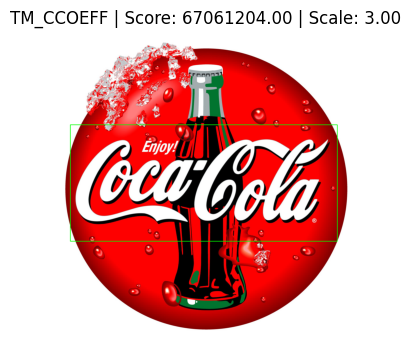

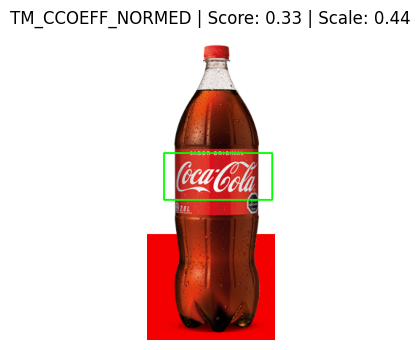

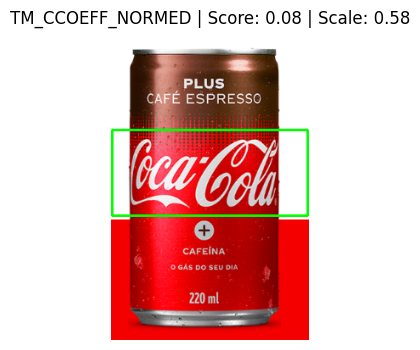

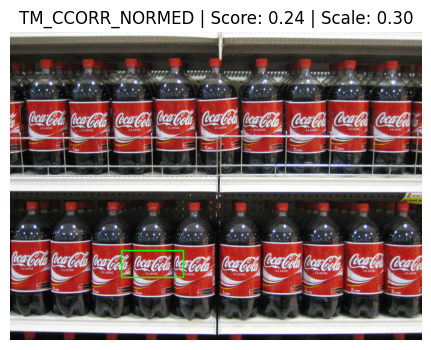

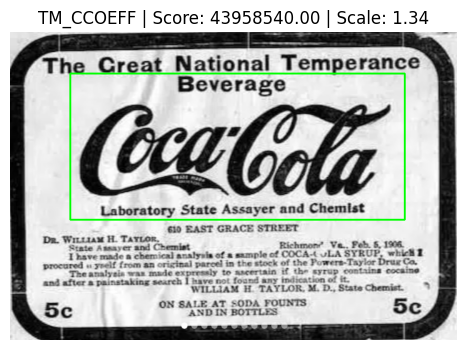

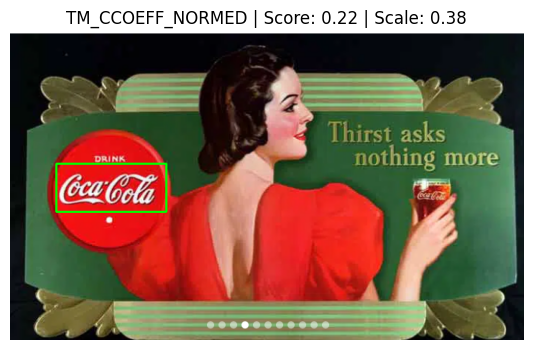

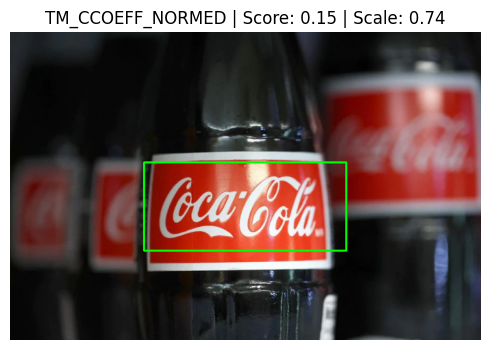

In [4]:
print("=== METODOS SELECCIONADOS ===")
execute_template_search('vision_computadora_I/Material_TPs/TP3/images/COCA-COLA-LOGO.jpg',
                        'vision_computadora_I/Material_TPs/TP3/template/pattern.png', method_name='TM_CCOEFF')
execute_template_search('vision_computadora_I/Material_TPs/TP3/images/coca_logo_1.png',
                        'vision_computadora_I/Material_TPs/TP3/template/pattern.png', method_name='TM_CCOEFF_NORMED')
execute_template_search('vision_computadora_I/Material_TPs/TP3/images/coca_logo_2.png', 'vision_computadora_I/Material_TPs/TP3/template/pattern.png',
                        min_scale=0.5, method_name='TM_CCOEFF_NORMED')
execute_template_search('vision_computadora_I/Material_TPs/TP3/images/coca_multi.png',
                        'vision_computadora_I/Material_TPs/TP3/template/pattern.png', method_name='TM_CCORR_NORMED')
execute_template_search('vision_computadora_I/Material_TPs/TP3/images/coca_retro_1.png',
                        'vision_computadora_I/Material_TPs/TP3/template/pattern.png', method_name='TM_CCOEFF')
execute_template_search('vision_computadora_I/Material_TPs/TP3/images/coca_retro_2.png',
                        'vision_computadora_I/Material_TPs/TP3/template/pattern.png', method_name='TM_CCOEFF_NORMED')
execute_template_search('vision_computadora_I/Material_TPs/TP3/images/logo_1.png',
                        'vision_computadora_I/Material_TPs/TP3/template/pattern.png', method_name='TM_CCOEFF_NORMED')

---

## Conclusión ejercicio 1
Se procesó cada imagen de prueba de forma individual para identificar el método de *template matching*, la escala óptima y el valor de correlación máximo alcanzado:

| Imagen                 | Método            | Escala | Score       |
|------------------------|-------------------|--------|-------------|
| COCA-COLA-LOGO.jpg     | TM_CCOEFF         | 3      | 67 061 204  |
| coca_logo_1.png        | TM_CCOEFF_NORMED  | 0.34   | 0.33        |
| coca_logo_2.png        | TM_CCOEFF_NORMED  | 0.58   | 0.08        |
| coca_multi.png         | TM_CCORR_NORMED   | 0.3    | 0.24        |
| coca_retro_1.png       | TM_CCOEFF         | 1.34   | 43 958 540  |
| coca_retro_2.png       | TM_CCOEFF_NORMED  | 0.38   | 0.22        |
| logo_1.png             | TM_CCOEFF_NORMED  | 0.74   | 0.15        |

En cada caso, se generó una vista superpuesta en la que solo se destaca la mejor coincidencia, simplificando la inspección visual.


### 2. Plantear y validar un algoritmo para múltiples detecciones en la imagen coca_multi.png con el mismo témplate del ítem 1

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def suppress_overlaps(boxes, overlap_threshold=0.3):
    """
    Suprime las regiones solapadas en función de un umbral definido.
    """
    if len(boxes) == 0:
        return []

    boxes = np.array(boxes)
    selected = []

    x1, y1, x2, y2 = boxes[:, :4].T
    scores = boxes[:, 4]
    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    order = np.argsort(scores)

    while len(order) > 0:
        current = order[-1]
        selected.append(current)

        xx1 = np.maximum(x1[current], x1[order[:-1]])
        yy1 = np.maximum(y1[current], y1[order[:-1]])
        xx2 = np.minimum(x2[current], x2[order[:-1]])
        yy2 = np.minimum(y2[current], y2[order[:-1]])

        width = np.maximum(0, xx2 - xx1 + 1)
        height = np.maximum(0, yy2 - yy1 + 1)
        overlap = (width * height) / areas[order[:-1]]

        order = np.delete(order, np.concatenate(([len(order) - 1], np.where(overlap > overlap_threshold)[0])))

    return boxes[selected].astype(int)

def fixed_scale_template_match(template_path, image_path, scale=1.0, method='TM_CCORR_NORMED',
                               edge_thresh1=100, edge_thresh2=200, match_threshold=0.95):
    """
    Realiza la correspondencia de plantillas a escala fija en una imagen de destino.
    """

    methods = {
        'TM_CCOEFF': cv2.TM_CCOEFF,
        'TM_CCOEFF_NORMED': cv2.TM_CCOEFF_NORMED,
        'TM_CCORR': cv2.TM_CCORR,
        'TM_CCORR_NORMED': cv2.TM_CCORR_NORMED,
        'TM_SQDIFF': cv2.TM_SQDIFF,
        'TM_SQDIFF_NORMED': cv2.TM_SQDIFF_NORMED
    }

    if method not in methods:
        raise ValueError(f"método reconocido: {method}")
    cv_method = methods[method]

    template = cv2.imread(template_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.imread(image_path)

    if template is None or image is None:
        raise IOError("Error al cargar la plantilla o la imagen de destino.")

    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    display_img = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2RGB)

    template_edges = cv2.Canny(template, edge_thresh1, edge_thresh2)
    image_edges = cv2.Canny(gray_image, edge_thresh1, edge_thresh2)

    scaled_template = cv2.resize(template_edges, (0, 0), fx=scale, fy=scale)
    h, w = scaled_template.shape

    if h > image_edges.shape[0] or w > image_edges.shape[1]:
        raise ValueError("La plantilla escalada supera las dimensiones de la imagen.")

    result = cv2.matchTemplate(image_edges, scaled_template, cv_method)
    min_val, max_val, _, _ = cv2.minMaxLoc(result)

    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        locations = np.where(result <= match_threshold * min_val)
    else:
        locations = np.where(result >= match_threshold * max_val)

    detections = []
    for (y, x) in zip(*locations):
        score = result[y, x]
        detections.append([x, y, x + w, y + h, score])

    final_detections = suppress_overlaps(detections)

    for x1, y1, x2, y2, _ in final_detections:
        cv2.rectangle(display_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

    plt.figure(figsize=(12, 6))
    plt.imshow(display_img)
    plt.title(f"{method} | Scale: {scale} | Matches: {len(final_detections)}")
    plt.axis("off")
    plt.show()

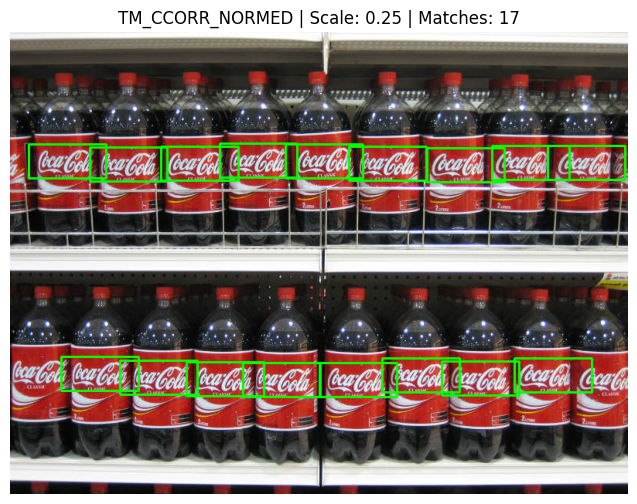

In [2]:
fixed_scale_template_match(
    template_path='vision_computadora_I/Material_TPs/TP3/template/pattern.png',
    image_path='vision_computadora_I/Material_TPs/TP3/images/coca_multi.png',
    scale=0.25,  # Reescala la plantilla antes de compararla con la imagen de entrada.
    match_threshold=0.72  # Umbral mínimo de similitud para considerar válida una detección (basado en el resultado de matchTemplate()).
)

### 3. Generalizar el algoritmo del item 2 para todas las imágenes.

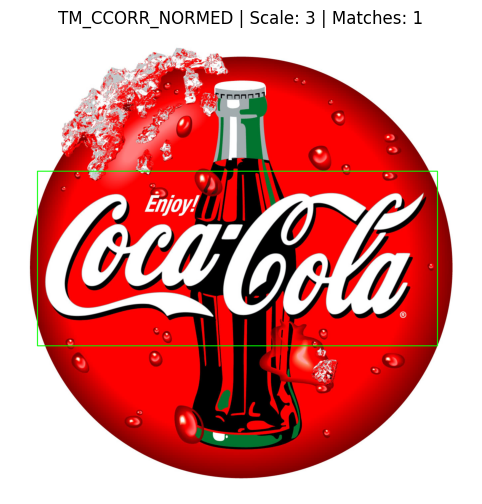

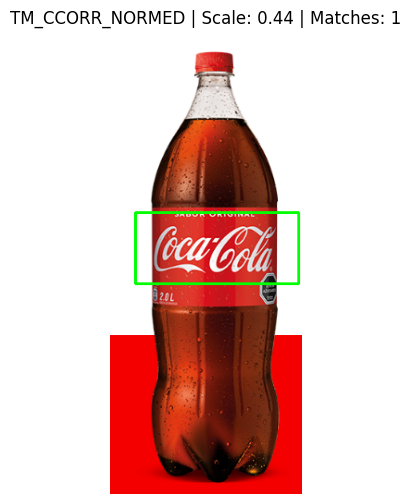

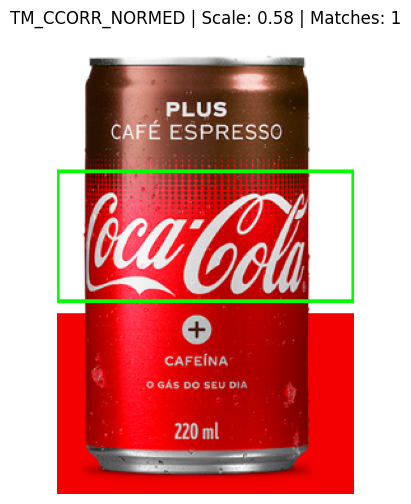

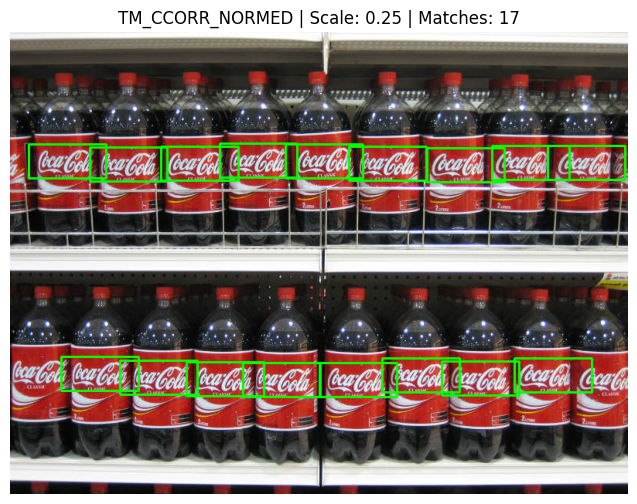

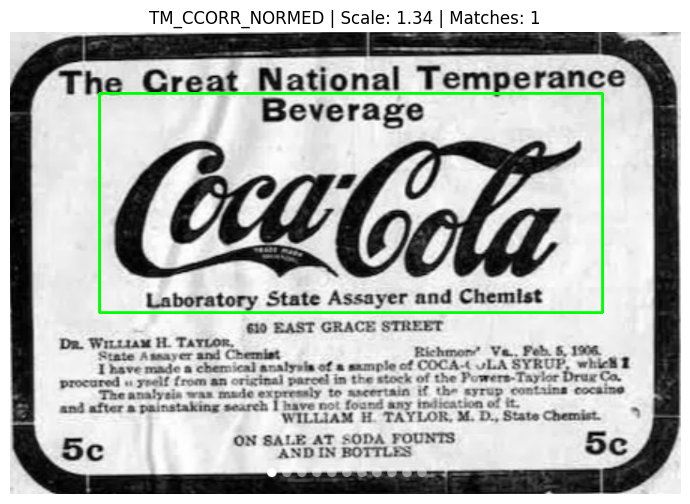

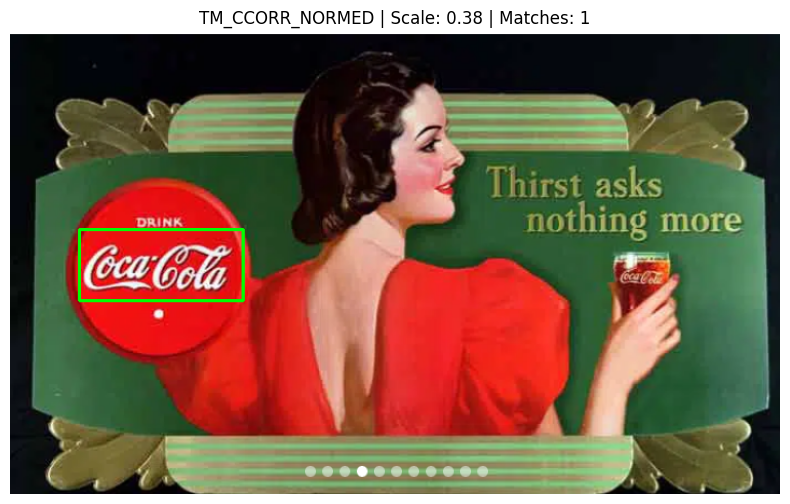

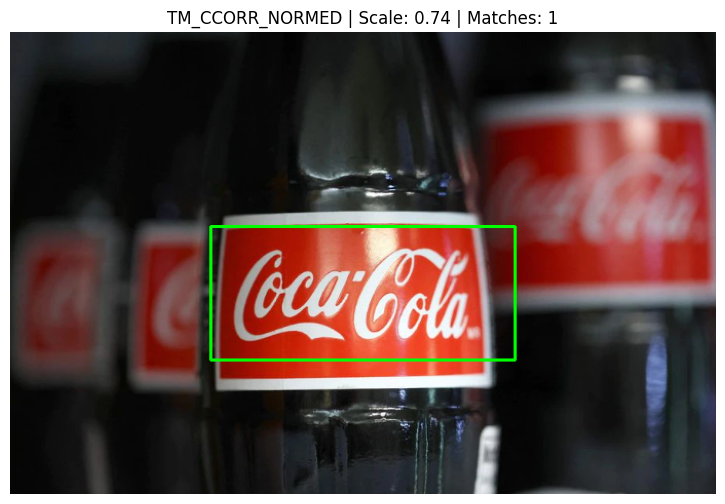

In [13]:
fixed_scale_template_match(
    template_path='vision_computadora_I/Material_TPs/TP3/template/pattern.png',
    image_path='vision_computadora_I/Material_TPs/TP3/images/COCA-COLA-LOGO.jpg',
    scale=3,  # Reescala la plantilla antes de compararla con la imagen de entrada.
)

fixed_scale_template_match(
    template_path='vision_computadora_I/Material_TPs/TP3/template/pattern.png',
    image_path='vision_computadora_I/Material_TPs/TP3/images/coca_logo_1.png',
    scale=0.44,  # Reescala la plantilla antes de compararla con la imagen de entrada.
)

fixed_scale_template_match(
    template_path='vision_computadora_I/Material_TPs/TP3/template/pattern.png',
    image_path='vision_computadora_I/Material_TPs/TP3/images/coca_logo_2.png',
    scale=0.58,  # Reescala la plantilla antes de compararla con la imagen de entrada.
)

fixed_scale_template_match(
    template_path='vision_computadora_I/Material_TPs/TP3/template/pattern.png',
    image_path='vision_computadora_I/Material_TPs/TP3/images/coca_multi.png',
    scale=0.25,  # Reescala la plantilla antes de compararla con la imagen de entrada.
    match_threshold=0.72  # Umbral mínimo de similitud para considerar válida una detección (basado en el resultado de matchTemplate()).
)

fixed_scale_template_match(
    template_path='vision_computadora_I/Material_TPs/TP3/template/pattern.png',
    image_path='vision_computadora_I/Material_TPs/TP3/images/coca_retro_1.png',
    scale=1.34,  # Reescala la plantilla antes de compararla con la imagen de entrada.
)

fixed_scale_template_match(
    template_path='vision_computadora_I/Material_TPs/TP3/template/pattern.png',
    image_path='vision_computadora_I/Material_TPs/TP3/images/coca_retro_2.png',
    scale=0.38,  # Reescala la plantilla antes de compararla con la imagen de entrada.
)

fixed_scale_template_match(
    template_path='vision_computadora_I/Material_TPs/TP3/template/pattern.png',
    image_path='vision_computadora_I/Material_TPs/TP3/images/logo_1.png',
    scale=0.74,  # Reescala la plantilla antes de compararla con la imagen de entrada.
)


---
## Conclusión ejercicios 2 y 3
Se desarrolló un algoritmo que, con un método específico y la escala fija, detecta las ocurrencias del logotipo en cada imagen de prueba:

- En `coca_multi.png`, se redujo el umbral a 0,72 para maximizar la cantidad de detecciones sin generar falsos positivos. Esto permitió identificar múltiples instancias del logotipo en una sola imagen.

- En las demás imágenes de validación (`COCA-COLA-LOGO.jpg`, `coca_logo_1.png`, `coca_logo_2.png`, `coca_retro_1.png`, `coca_retro_2.png` y `logo_1.png`), se utilizó el umbral por defecto (alto) para asegurar la detección de una única coincidencia con elevado nivel de confianza.

Los resultados confirman que ajustar el umbral según el escenario —umbral alto para detección única y 0,72 para entornos con múltiples instancias— mejora significativamente la precisión en la detección del logotipo.
